# Group Members:

*   David Pérez Carrasco (241375)
*   Nicolás Vila Alarcón (240230)
*   Guillem Escriba Molto (242123)

**Needed theory contents**: To minimize a function of two parameters given certain constraints on them. However, in the case of the function of this lab, we find that it is not a differentiable function at x = 0 because of the term 
||Ax|| (we would see a square root of 0). For this, we are not able to apply the typical gradient descent algorithm to this function as it is (it would not converge to an optimal value). For the purpose of finding a minimum for the function, we have to note that ||Ax|| = max <x, y>, where ||y||<=1. Even though this process adds a new variable, and at first it may seem a more complicated function, we observe that now we have a differentiable function if we write H(x,y) =<Ax, y> +1/2λ *||x-b||^2. Considering f(x) = max_y𝝐C H(x, y), where C = {y:||y||<=1}. 

Now, in order to find a minimum of the function we can find min_x f(x) = min_x max_y𝝐C H(x,y). Since H(x, y) is concave on any fixed x, and convex on any fixed y, we can also state the problem as max_y𝝐C min_x H(x,y). To find a solution we can now apply the typical gradient descent algorithm. One approach is to solve the problem for both variables at the same time (primal-dual) using gradient descent and ascent for x and y respectively. An other method (dual) would be to find first min_x H(x,y) = f_d (y) and then find the maximum of f_d(y) given the restriction for y.

---



In this lab, we will try to denoise an image, as we have tried in earlier labs, but with a different energy function. In the other energy functions we had for image denoising, we had a power of 2 in a term of our energy function which penalized too much certain differents which made that the edges were too blurry. Now, using the knowledge of the previous lab, we will be able to take aay the power of 2 in the energy function and leave only the norm. As we have learnt in theory class, we can't apply directly a gradient descent to that function because it is non-differentiable. For solving it, we will need to introduce a new variable under some constraints as seen in the previous lab, in order to solve this type of problems. 

In this lab we will be applying this way of solving non-differentiable energy function to denoise an image but keeping the edges of the original image, so it will not be as blurry as the denoised image in Lab 2.

---



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd "/content/drive/MyDrive/Curs 2021-2022/3r Trimestre/Optimization Techniques/Labs/Lab6/image"

/content/drive/MyDrive/Curs 2021-2022/3r Trimestre/Optimization Techniques/Labs/Lab6/image


In [4]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import clear_output, display
import os
import sys

In [6]:
# Read the image
images_dir = os.path.abspath(os.path.join(os.getcwd(), "image"))
image_real = np.array(Image.open(os.path.join(images_dir, "/content/drive/MyDrive/Curs 2021-2022/3r Trimestre/Optimization Techniques/Labs/Lab6/image/lena.pgm"))).astype(np.int16)
np.random.seed(4)
image_noisy = image_real + 2 * np.random.uniform(high = 50, size = image_real.shape)

Text(0.5, 1.0, 'Noisy Image')

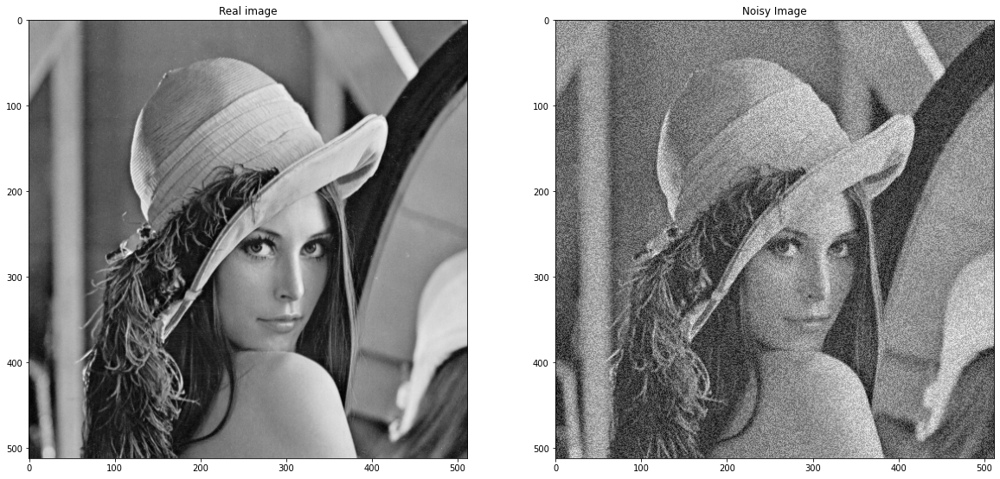

In [7]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 12))
ax1.imshow(image_real, cmap = "gray")
ax1.set_title("Real image")
ax2.imshow(image_noisy, cmap = "gray")
ax2.set_title("Noisy Image")

In [8]:
def im_fwd_gradient(image: np.matrix):
    """
    Discrete gradient of an image using forward differences, with homogeneous Neuman boundary conditions.

    :param u: image (MxN)
            
    :return gradu_j: partial derivative in the j (rows) direction (also x direction)
    :return gradu_i: partial derivative in the i (cols) direction (also y direction)
    """
    # Get the size of the image
    image_shape = image.shape
    
    # Calculate both gradients
    gradu_j = np.append(np.diff(image, axis = 1), np.zeros((image_shape[0], 1)), axis = 1)
    gradu_i = np.append(np.diff(image, axis = 0), np.zeros((1, image_shape[1])), axis = 0)
    return gradu_i, gradu_j

def im_bwd_divergence(gradient_i: np.matrix,
                      gradient_j: np.matrix):
    """
    Discrete divergence of a vector field using backwards differences. 
    This is the negative transpose of the im_fwd_gradient
    
    :param gradient_i: component of g in the direction j (rows) (also x direction)
    :param gradient_j: component of g in the direction i (cols) (also y direction)
    
    :return divg: backwards divergence of g
    """
    # Backwards j partial derivative of gradient_j
    gradient_j[:, gradient_j.shape[1] - 1] = 0
    divg = np.diff(np.append(np.zeros((gradient_j.shape[0], 1)), gradient_j, axis = 1), axis = 1)
    
    # Backwards i partial derivative of gradient_i
    gradient_i[gradient_i.shape[0] - 1, :] = 0
    divg = np.diff(np.append(np.zeros((1, gradient_i.shape[1])), gradient_i, axis = 0), axis = 0) + divg
    
    return divg

## **1. Complete the function rof_primal_dual. Follow the comments provided in the code.**

In [9]:
def rof_primal_dual(f: np.matrix, 
                    lambda_: float, 
                    pd_prms: dict,
                    fig, 
                    ax1, 
                    ax2):
    # Get the params
    max_iters = pd_prms.get("max_iters")
    tolerance = pd_prms.get("tolerance")
    delta     = pd_prms.get("delta")
    theta     = pd_prms.get("theta")
    sz = f.shape # M = sz(1), N = sz(2)

    # initialize primal variable
    u = f

    # initialize dual variable (a vector valued image)
    p_j = np.zeros(sz)
    p_i = np.zeros(sz)
    div_p = im_bwd_divergence(p_i, p_j)

    # grad of f, needed later
    gf_i, gf_j = im_fwd_gradient(f)

    # vectors with function values
    fps = []
    fds = []
    dg = [] #To make a graph of the dual gap

    it = 0
    dual_gap = np.inf
    while (dual_gap > tolerance) and (it < max_iters):

        # Update the iteration counter
        it += 1

        # TODO: update primal variable with a gradient descent step
        u = u - theta*(1/lambda_*(u-f)-div_p)

        # update gradient of primal variable
        gu_i, gu_j = im_fwd_gradient(u)

        # TODO: update dual variable - gradient ascent
        p_j = p_j + delta*gu_j
        p_i = p_i + delta*gu_i

        # TODO: project over the feasible set
        # HINT: For each k,l p_i(k,l) and p_j(k,l) are the i and j components of a
        # two dimensional vector p(k,l) = [p_i(k,l), p_j(k,l)] this vector needs
        # to have norm less or equal than 1. This is done by dividing p(k,l) by
        #
        # max{1,|p(k,l)|},   where    |p(k,l)| = sqrt(p_i(k,l)^2 + p_j(k,l)^2)
        # 
        # Try to do this using matrix operations
        denom = np.maximum(np.ones(sz),np.sqrt(np.power(p_i,2) +np.power(p_j,2)))
        p_i = p_i/denom
        p_j = p_j/denom

        # TODO: update divergence of dual variable p (remember, p has been projected in the previous lines)
        div_p = im_bwd_divergence(p_i, p_j)

        # primal energy
        PE = np.sqrt(np.power(gu_j, 2) + np.power(gu_i, 2)).sum()
        PE = PE + 1/2 / lambda_ * np.power(u - f, 2).sum()

        # TODO: dual energy
        term1 = np.multiply(gu_i,p_i).sum() + np.multiply(gu_j,p_j).sum()
        term2 = -lambda_/2*np.multiply(div_p,div_p).sum()
        
        DE = term1 + term2

        # we normalize the energies between the number of pixels
        PE = PE / np.prod(sz) 
        DE = DE / np.prod(sz)

        # dual gap
        dual_gap = PE - DE

        fps.append(PE)
        fds.append(DE)
        dg.append(dual_gap)
        
        # Plot
        if it % 10 == 0:
            # display primal and dual variable
            ax1.imshow(u, cmap = "gray")
            ax2.imshow(np.concatenate((p_i, p_j), axis = 1), cmap = "gray")
            clear_output(wait=True)
            display(fig) 
            
            # display information - dual gap
            print("[it {0} of {1}] DG = {2} - {3} = {4}".format(it, max_iters, PE, DE, dual_gap))

    return fps, fds, dg

#### **Run the primal dual**

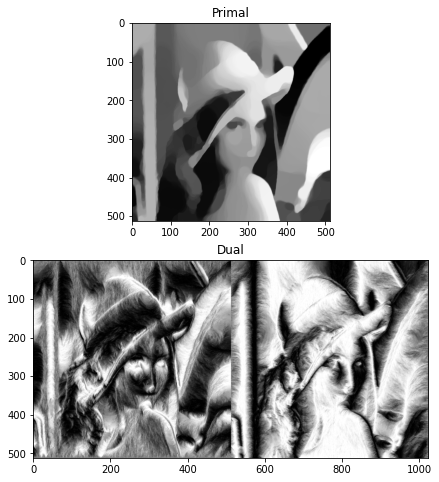

[it 500 of 500] DG = 3.2874082008600016 - -0.8789776872230375 = 4.166385888083039


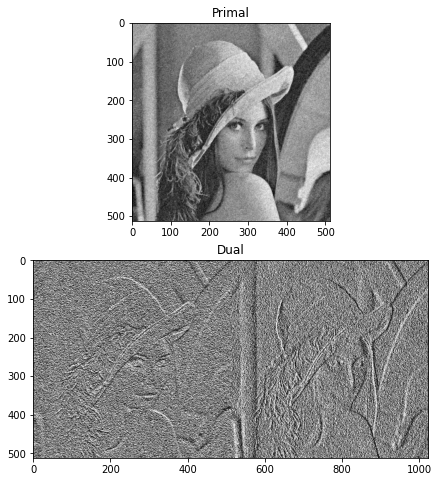

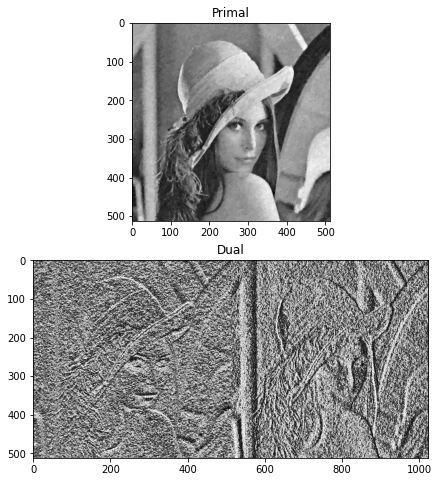

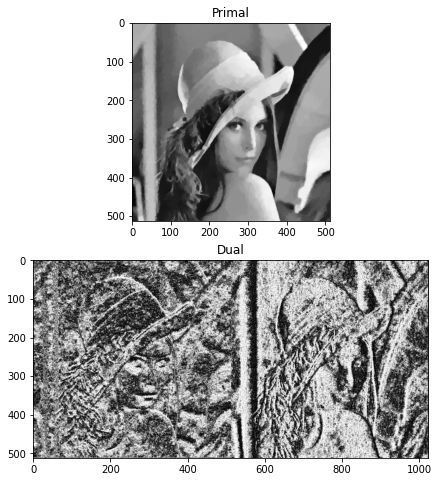

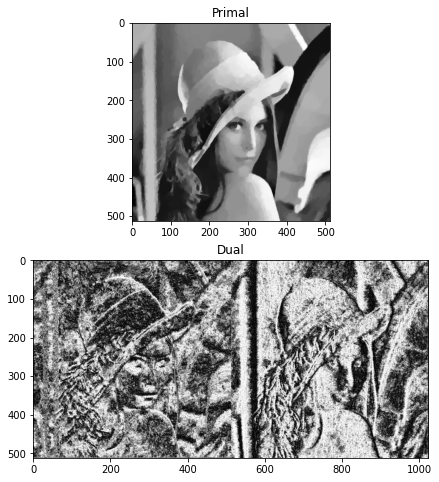

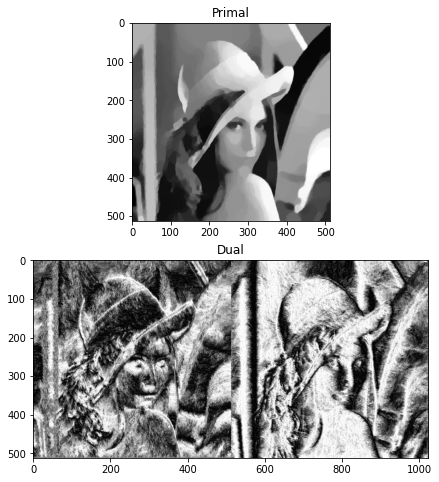

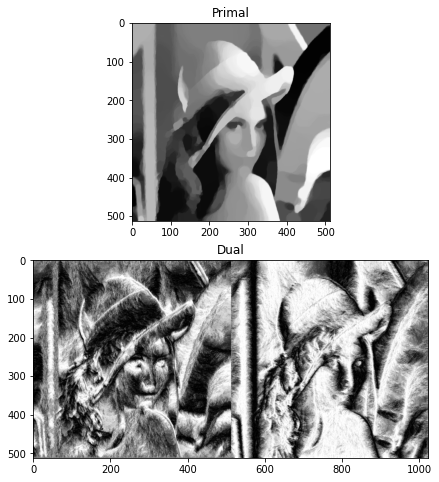

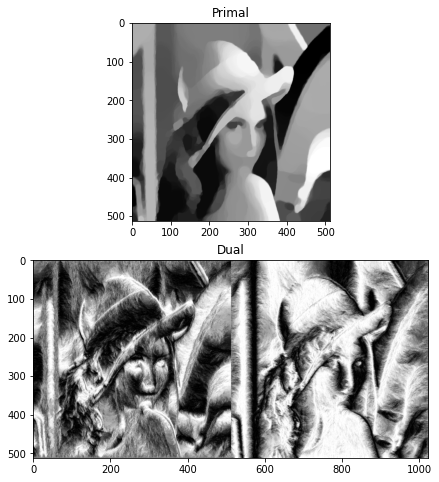

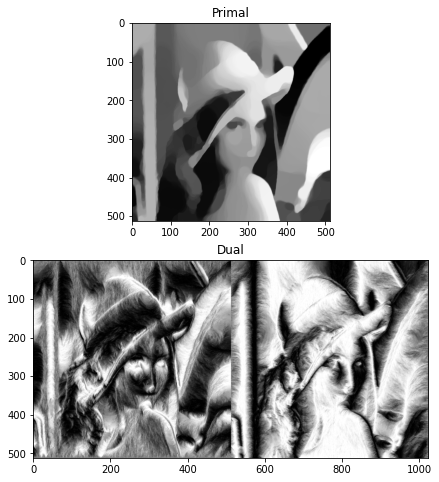

In [10]:
# Define the parameters
lambdas = [10, 20, 40, 50, 100, 150, 200, 300]
for lambda_ in lambdas:
  #lambda_ = 300
  pd_prms = {"max_iters": 500,
              "tolerance": 1e-4,
              "delta": 1/2,
              "theta": 1/2
            }

  print('Current lambda:', lambda_)
  # Build up the plot
  fig, (ax1, ax2) = plt.subplots(nrows = 2, ncols = 1, figsize = (14, 8))
  ax1.set_title("Primal")
  ax2.set_title("Dual")

  # Run the primal dual
  fps, fds, dual_gap = rof_primal_dual(image_noisy, lambda_, pd_prms, fig, ax1, ax2)

**1. Which is the effect of λ on the results?**
We can see that with the lowest lambda value, 10, the image is too blurred, and the dual approach seems like a cartoon. The two following values give us a less blurred image, but with some noise yet, but with lambda between 20 and 50 or even 100 we obtain the optimal result, the closer to the original image, and once we increase these values we obtain more blurred images.
**2.   Are the edges of the image well preserved? What happens with the textures?**
When it comes to the edges, we notice they are actually well preserved for the optimal values of lambda commented before, but while increasing that value we obtain also images with more blurred edges, making the whole image to look bad, so the optimal values, being stricter, would be between 20 and 50.

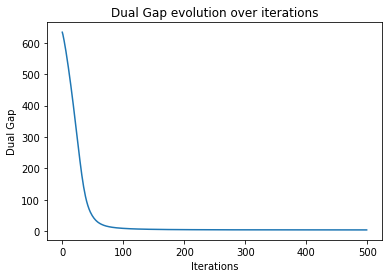

In [11]:
#Graph of dual-gap
plt.plot(dual_gap)
plt.title('Dual Gap evolution over iterations')
plt.xlabel('Iterations')
plt.ylabel('Dual Gap')
plt.show()

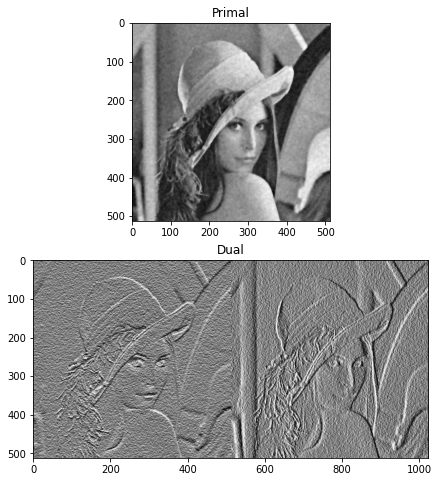

[it 500 of 500] DG = 16.477063822284055 - -9.105789206296553 = 25.582853028580608


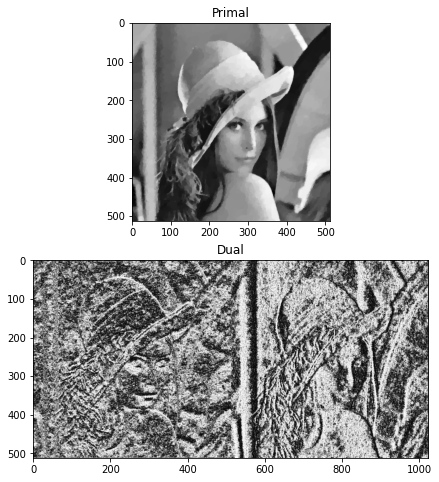

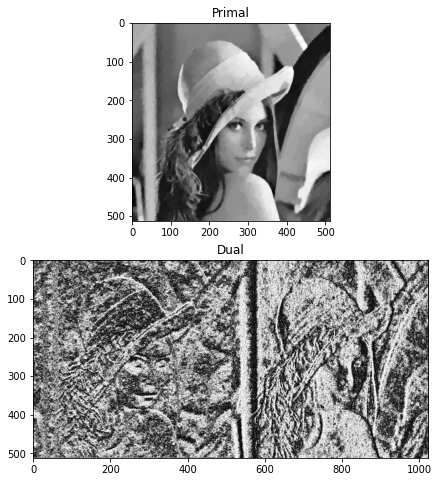

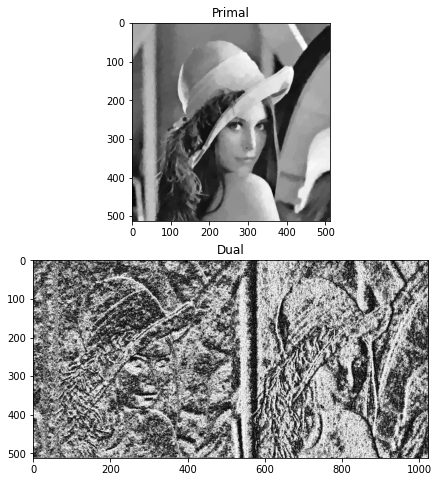

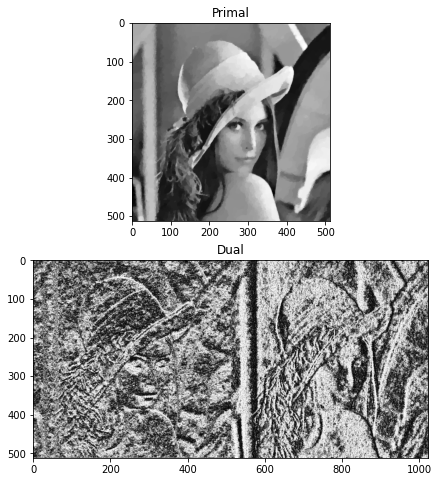

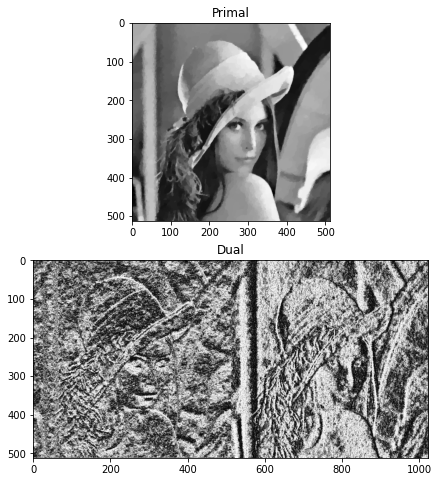

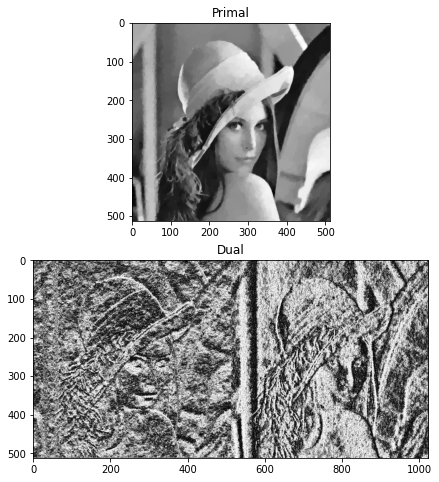

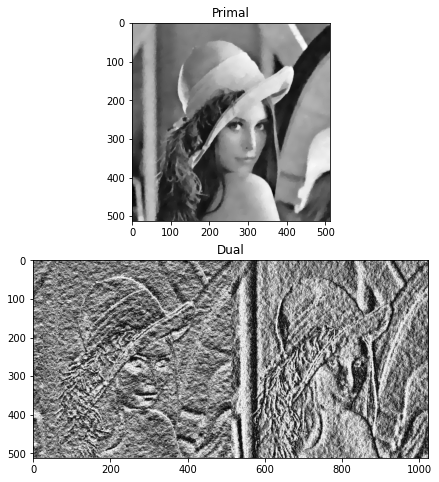

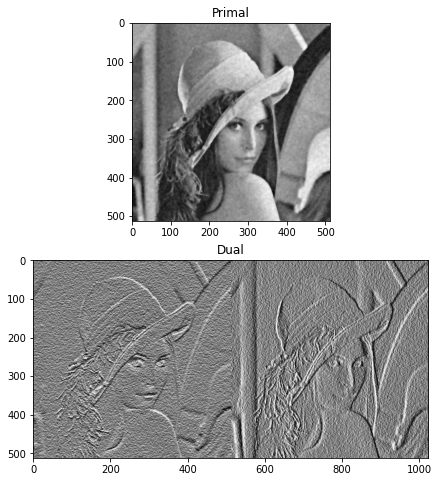

In [12]:
lambda_ = 35
deltas = [1,2,5,10,50, 100,1000,10000]
dual_gaps = []
for delta in deltas:
  #lambda_ = 100
  pd_prms = {"max_iters": 500,
              "tolerance": 1e-4,
              "delta": 1/delta,
              "theta": 1/2
            }

  print('Current delta:', delta)
  # Build up the plot
  fig, (ax1, ax2) = plt.subplots(nrows = 2, ncols = 1, figsize = (14, 8))
  ax1.set_title("Primal")
  ax2.set_title("Dual")
  # Run the primal dual
  fps, fds, dual_gap = rof_primal_dual(image_noisy, lambda_, pd_prms, fig, ax1, ax2)
  dual_gaps.append(dual_gap)




Delta: 0.02857142857142857(1)


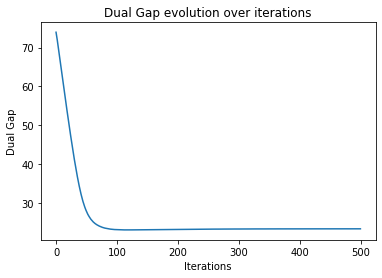

Delta: 0.014285714285714285(2)


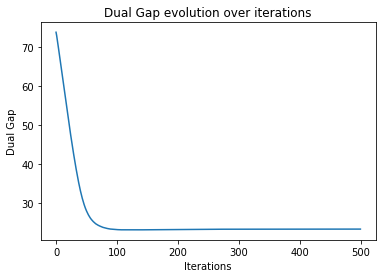

Delta: 0.005714285714285714(5)


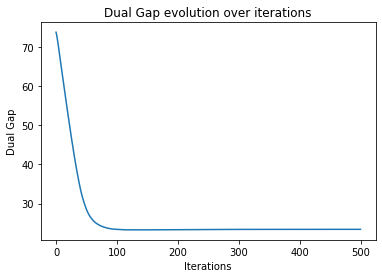

Delta: 0.002857142857142857(10)


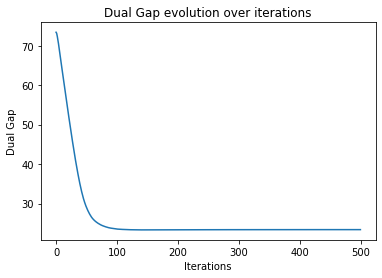

Delta: 0.0005714285714285715(50)


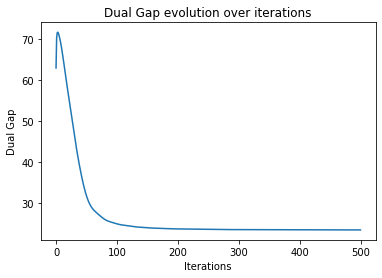

Delta: 0.00028571428571428574(100)


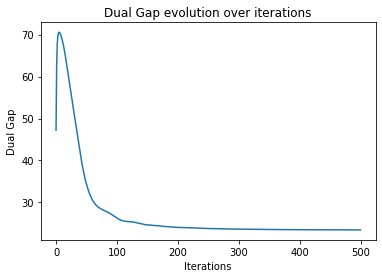

Delta: 2.857142857142857e-05(1000)


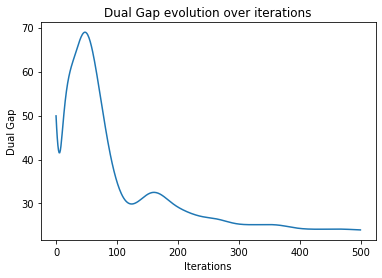

Delta: 2.8571428571428573e-06(10000)


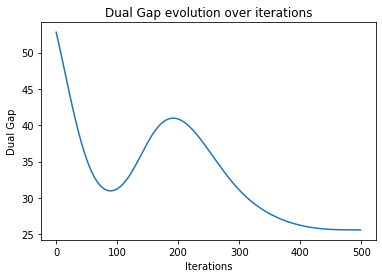

In [13]:
for i in range(len(deltas)):
#Graph of dual-gap
  plt.plot(dual_gaps[i])
  print("Delta: {}({})".format(1/deltas[i]/lambda_,deltas[i]))
  plt.title('Dual Gap evolution over iterations')
  plt.xlabel('Iterations')
  plt.ylabel('Dual Gap')
  plt.show()

**3. Look at graphs of the evolution of the dual gap with the iterations. What do you observe? What happens when you change step size δ?**
The dual gap experiments a logarithmic decrease as we can see in the graph, reacing the 0 value before the 100 iterations.

We can notice a strange phenomen when changing the delta values. At first we have a decreasing logarithm plot, and the following values return the same dual gap graph, but while increasing more considerably the delta value, we see that the initial dual gap decreases. Originally the initial dual gap started at 70 aproximately, so while increasing the step size it decreases until starting at 50 with a delta=1/100, but it immediately increases until reaching 70 of DG and then it behaves the same way as the original plot, so it has an effect similar to retarding the dual gap decrease. However, with delta=1/1000 or 1/10000 it experiments a more strange behaviour, with more curves and local maximums, so it stops being an inmediat decrease and starts being less effective.

**4. Use the algorithm with new examples, for example, own photos.**


Text(0.5, 1.0, 'Noisy Image')

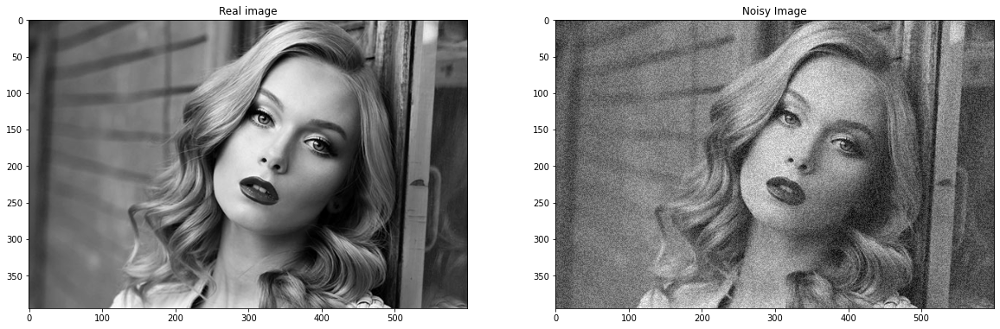

In [14]:
# Read the image
images_dir = os.path.abspath(os.path.join(os.getcwd(), "/content/drive/MyDrive/Curs 2021-2022/3r Trimestre/Optimization Techniques/Labs/Lab6/image"))
image_real = np.array(Image.open(os.path.join(images_dir, "/content/drive/MyDrive/Curs 2021-2022/3r Trimestre/Optimization Techniques/Labs/Lab6/image/picture.pgm"))).astype(np.int16)
np.random.seed(4)
image_noisy = image_real + 2 * np.random.uniform(high = 50, size = image_real.shape)

fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 12))
ax1.imshow(image_real, cmap = "gray")
ax1.set_title("Real image")
ax2.imshow(image_noisy, cmap = "gray")
ax2.set_title("Noisy Image")

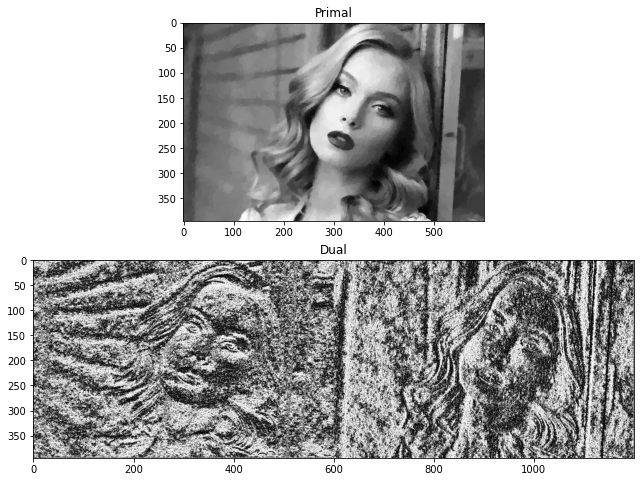

[it 500 of 500] DG = 17.353963225417292 - -8.709939607165817 = 26.06390283258311


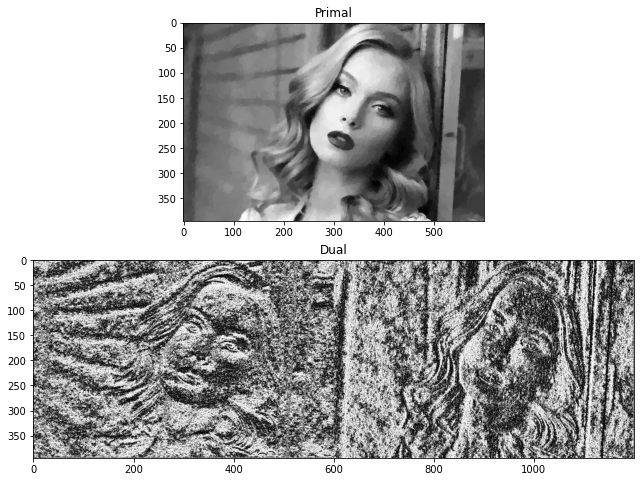

In [17]:
# Define the parameters
lambda_ = 30
pd_prms = {"max_iters": 500,
              "tolerance": 1e-4,
              "delta": 1/2,
              "theta": 1/2
           }

# Build up the plot
fig, (ax1, ax2) = plt.subplots(nrows = 2, ncols = 1, figsize = (14, 8))
ax1.set_title("Primal")
ax2.set_title("Dual")

# Run the primal dual
fps, fds, dg = rof_primal_dual(image_noisy, lambda_, pd_prms, fig, ax1, ax2)

After trying our primal dual algorithm with our own photo, one b&w portrait, we got quite good results with lambda=30, since we can see almost all the noise is gone and the edges are well preserved.

## **2. Complete the function rof_dual. Follow the comments provided in the code.**

In [ ]:
def rof_dual(f: np.matrix, 
             lambda_: float, 
             pd_prms: dict,
             fig, 
             ax1, 
             ax2):
    # Get the params
    max_iters = pd_prms.get("max_iters")
    tolerance = pd_prms.get("tolerance")
    delta     = pd_prms.get("delta")
    sz = f.shape # M = sz(1), N = sz(2)

    # initialize dual variable (a vector valued image)
    p_j = np.zeros(sz)
    p_i = np.zeros(sz)
    div_p = im_bwd_divergence(p_i, p_j)

    # grad of f, needed later
    gf_i, gf_j = im_fwd_gradient(f)

    # vectors with function values
    fps = []
    fds = []
    dg = [] #To make a graph of the dual gap
    it = 0
    dual_gap = np.inf
    while (dual_gap > tolerance) and (it < max_iters):

        # Update the iteration counter
        it += 1

        # TODO: update primal variable and its gradient - this is u^*(xi) for current xi 
        u_star = f + lambda_*div_p

        # update gradient of primal variable
        gu_star_i, gu_star_j = im_fwd_gradient(u_star)

        # TODO: update dual variable - gradient ascent
        p_j = p_j + delta*gu_star_j
        p_i = p_i + delta*gu_star_i

        # TODO: project over the feasible set
        denom = np.maximum(np.ones(sz),np.sqrt(pow(p_i,2) + pow(p_j, 2)))
        p_j = p_j/denom
        p_i = p_i/denom
        
        # HINT: For each k,l p_i(k,l) and p_j(k,l) are the i and j components of a
        # two dimensional vector p(k,l) = [p_i(k,l), p_j(k,l)] this vector needs
        # to have norm less or equal than 1. This is done by dividing p(k,l) by
        #
        # max{1,|p(k,l)|},   where    |p(k,l)| = sqrt(p_i(k,l)^2 + p_j(k,l)^2)
        # 
        # Try to do this using matrix operations


        # TODO: update divergence of dual
        div_p = im_bwd_divergence(p_i, p_j)

        # primal energy
        PE = np.sqrt(np.power(gu_star_j, 2) + np.power(gu_star_i, 2)).sum()
        PE = PE + 1/2 / lambda_ * np.power(u_star - f, 2).sum()

        # TODO: dual energy
        norm = np.multiply(div_p, div_p).sum()
        term1 = np.multiply(gf_i, p_i).sum() + np.multiply(gf_j, p_j).sum()
        term2 = lambda_/2*norm
        DE = term1-term2

        # we normalize the energies between the number of pixels
        PE = PE / np.prod(sz) 
        DE = DE / np.prod(sz)

        # dual gap
        dual_gap = PE - DE

        fps.append(PE)
        fds.append(DE)
        dg.append(dual_gap)
        # Plot
        if it % 10 == 0:
            # display primal and dual variable
            ax1.imshow(u_star, cmap = "gray")
            ax2.imshow(np.concatenate((p_i, p_j), axis = 1), cmap = "gray")
            clear_output(wait=True)
            display(fig) 
            
            # display information - dual gap
            print("[it {0} of {1}] DG = {2} - {3} = {4}".format(it, max_iters, PE, DE, dual_gap))

    return fps, fds, dg

#### **Run the dual**

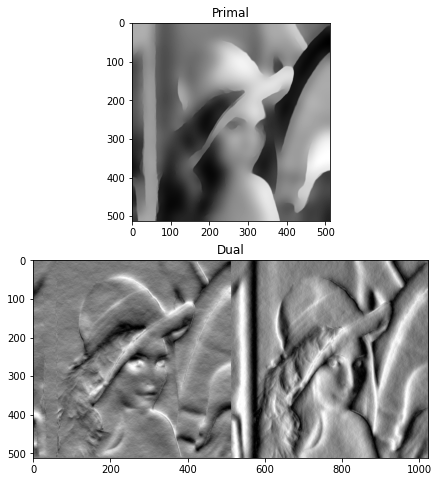

[it 500 of 500] DG = 3.3500603877660367 - 3.0264417001607047 = 0.32361868760533197


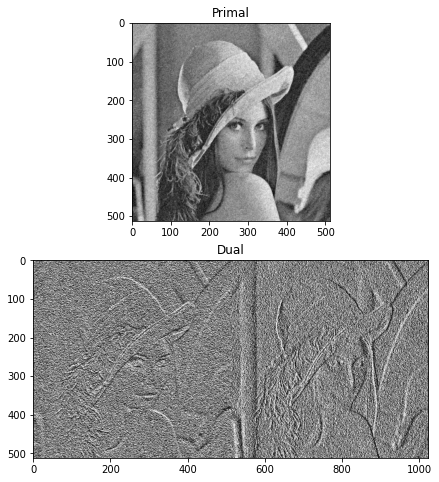

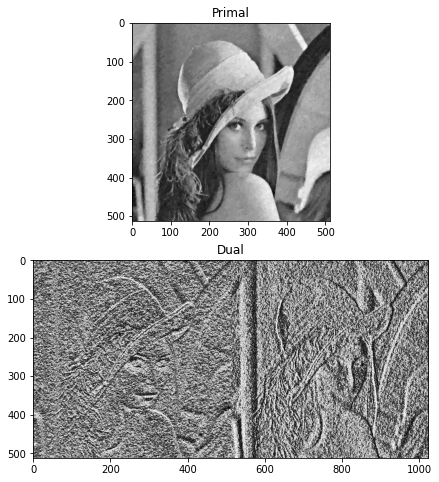

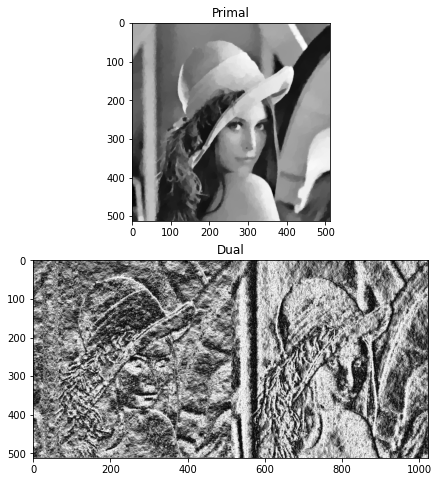

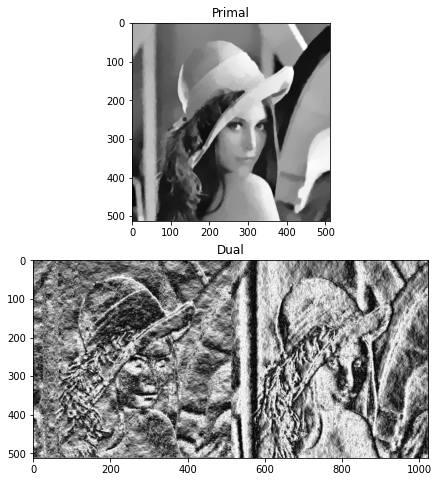

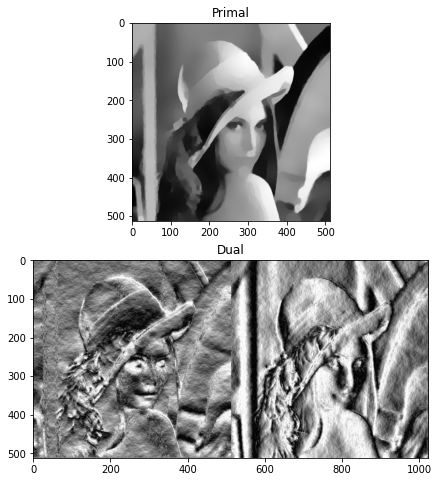

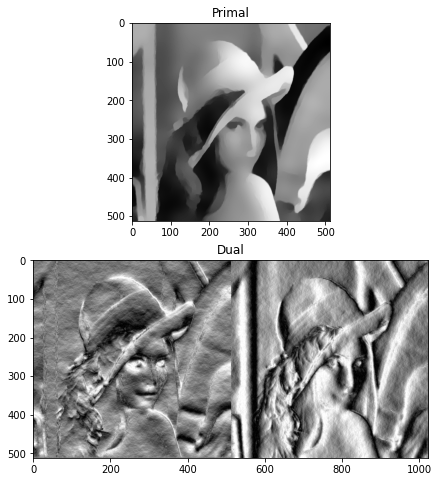

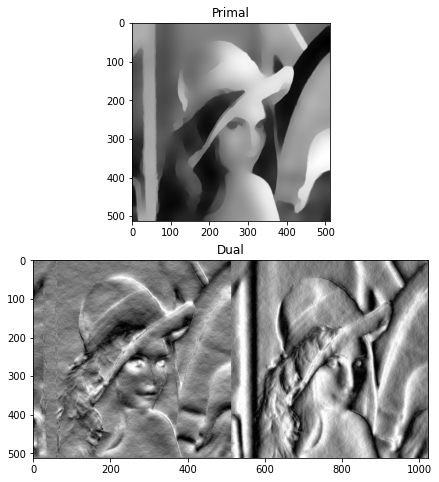

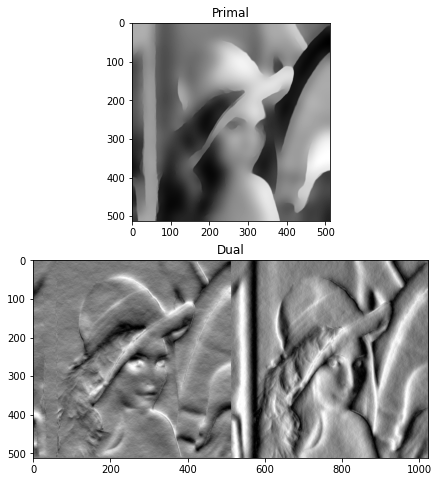

In [ ]:
# Define the parameters
lambdas = [10, 20, 40, 50, 100, 150, 200, 300]
for lambda_ in lambdas:
  #lambda_ = 100
  pd_prms = {"max_iters": 500,
              "tolerance": 1e-4,
              "delta": 1/4.5 / lambda_
            }

  print('Current lambda:', lambda_)
  # Build up the plot
  fig, (ax1, ax2) = plt.subplots(nrows = 2, ncols = 1, figsize = (14, 8))
  ax1.set_title("Primal")
  ax2.set_title("Dual")
  # Run the primal dual
  fps, fds, dual_gap = rof_dual(image_noisy, lambda_, pd_prms, fig, ax1, ax2)

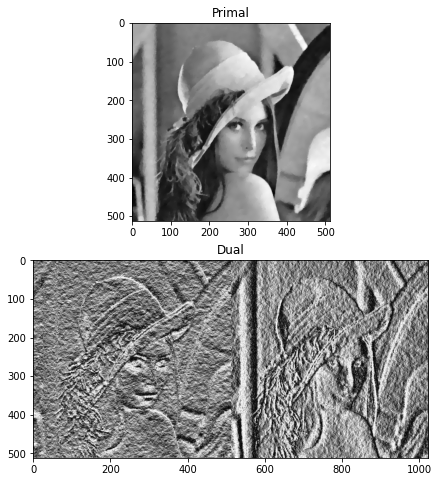

[it 500 of 500] DG = 15.212629409527347 - 14.956780538583441 = 0.25584887094390574


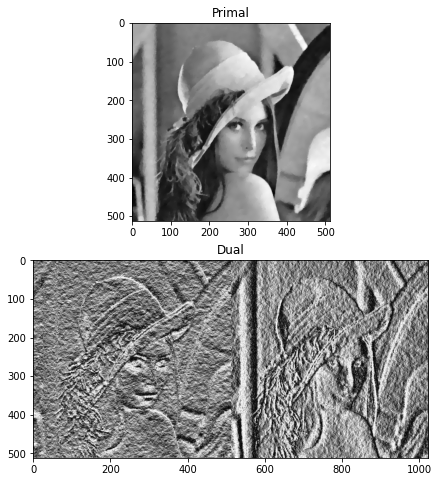

In [ ]:
# Define the parameters
lambda_ = 35
#lambda_ = 100
pd_prms = {"max_iters": 500,
            "tolerance": 1e-4,
            "delta": 1/40.5 / lambda_
          }

print('Current lambda:', lambda_)
# Build up the plot
fig, (ax1, ax2) = plt.subplots(nrows = 2, ncols = 1, figsize = (14, 8))
ax1.set_title("Primal")
ax2.set_title("Dual")
# Run the primal dual
fps, fds, dual_gap = rof_dual(image_noisy, lambda_, pd_prms, fig, ax1, ax2)


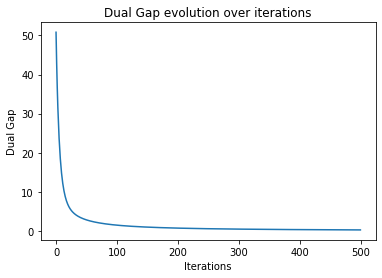

In [ ]:
#Graph of dual-gap
plt.plot(dual_gap)
plt.title('Dual Gap evolution over iterations')
plt.xlabel('Iterations')
plt.ylabel('Dual Gap')
plt.show()

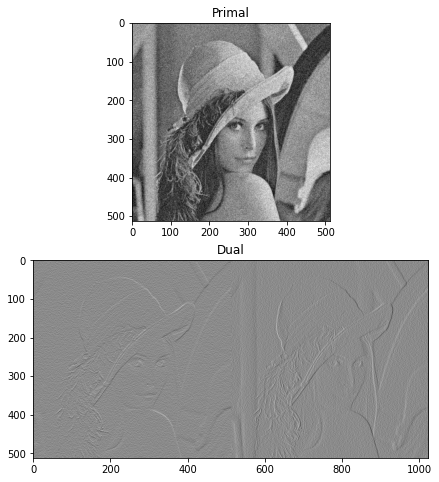

[it 500 of 500] DG = 42.68122084148933 - 4.026724588627119 = 38.65449625286221


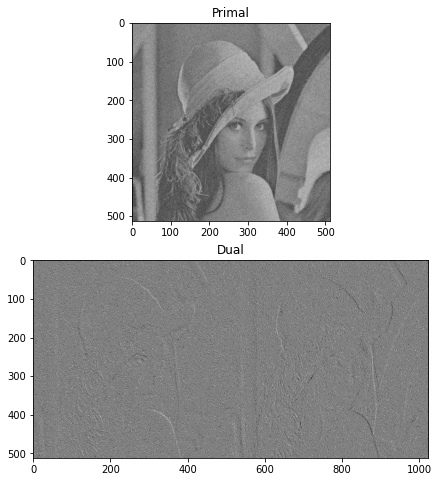

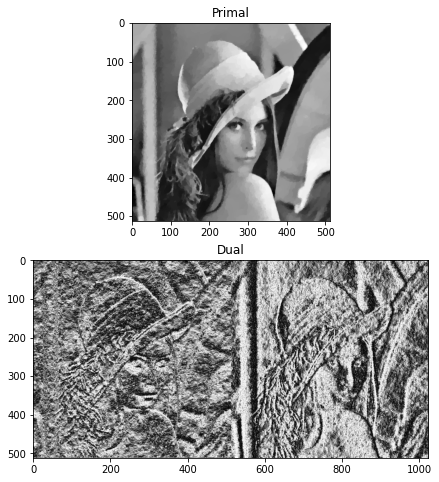

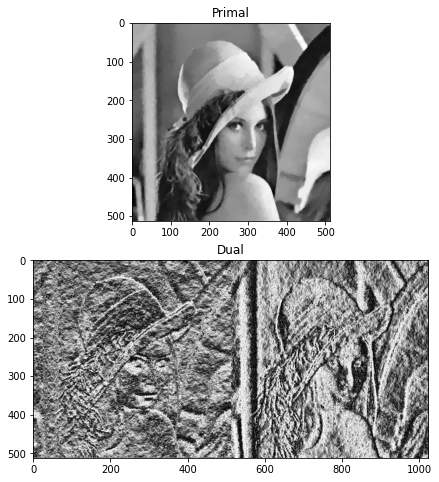

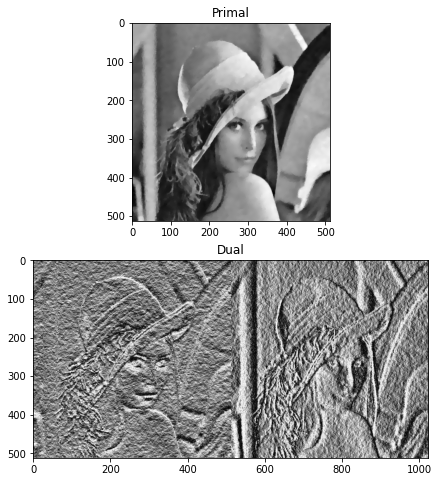

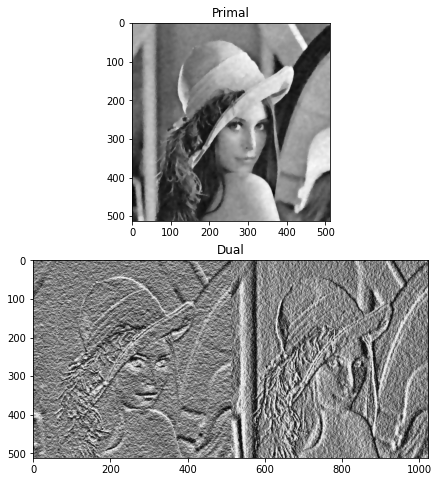

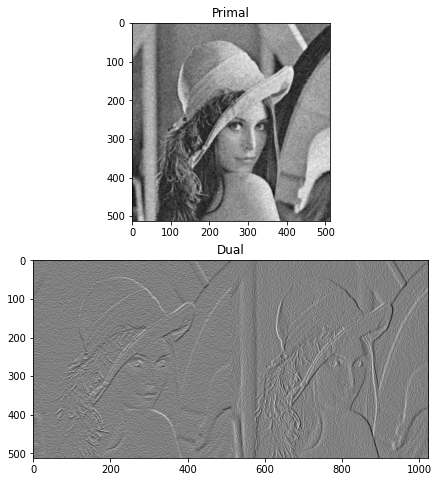

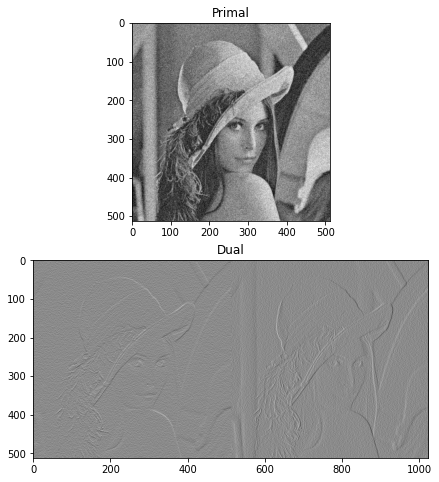

In [ ]:
lambda_ = 35
deltas = [1,5,10,50, 100,1000,10000]
dual_gaps = []
for delta in deltas:
  #lambda_ = 100
  pd_prms = {"max_iters": 500,
              "tolerance": 1e-4,
              "delta": 1/delta / lambda_
            }

  print('Current delta:', delta)
  # Build up the plot
  fig, (ax1, ax2) = plt.subplots(nrows = 2, ncols = 1, figsize = (14, 8))
  ax1.set_title("Primal")
  ax2.set_title("Dual")
  # Run the primal dual
  fps, fds, dual_gap = rof_dual(image_noisy, lambda_, pd_prms, fig, ax1, ax2)
  dual_gaps.append(dual_gap)




Delta: 0.02857142857142857(1)


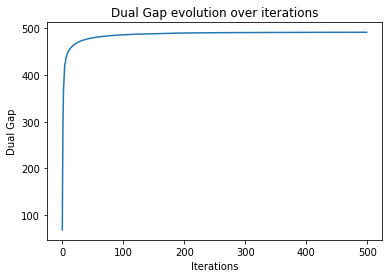

Delta: 0.005714285714285714(5)


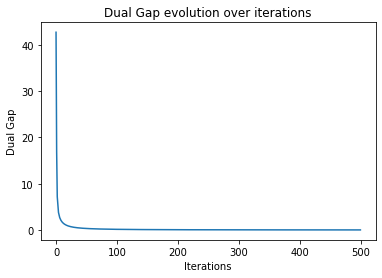

Delta: 0.002857142857142857(10)


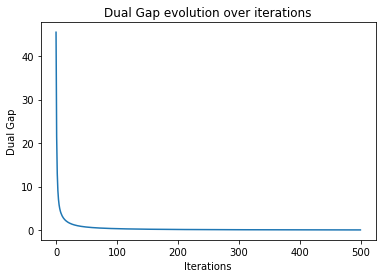

Delta: 0.0005714285714285715(50)


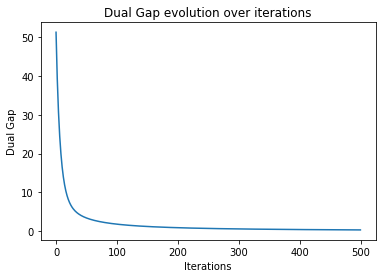

Delta: 0.00028571428571428574(100)


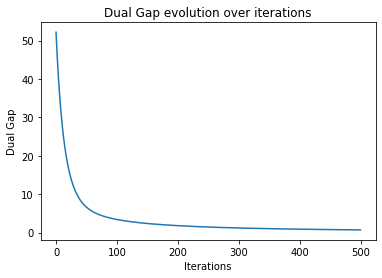

Delta: 2.857142857142857e-05(1000)


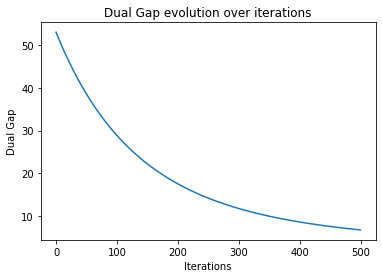

Delta: 2.8571428571428573e-06(10000)


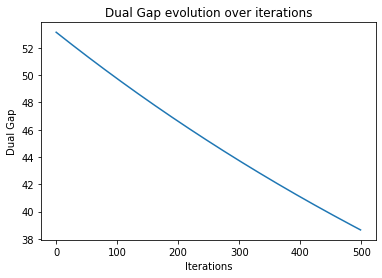

In [ ]:
for i in range(len(deltas)):
#Graph of dual-gap
  plt.plot(dual_gaps[i])
  print("Delta: {}({})".format(1/deltas[i]/lambda_,deltas[i]))
  plt.title('Dual Gap evolution over iterations')
  plt.xlabel('Iterations')
  plt.ylabel('Dual Gap')
  plt.show()

**1.   Which is the effect of λ on the results?**
After trying several values of lambda we have observed that the bigger lambda was, the denoised image was more blurry. With relatively low values of lambda we could get a denoised image similar to the original one. When we set the lambda to way higher values, the image was really blurry, it was similar to a cartoon.At first, even though the image was getting more and more blurry, the edges were still well preserved. However, at the end when we set really high lambdas, we finally lost those preserved edges and we got a completely blurred image.

**2.   Are the edges of the image well preserved? What happens with the textures?**
As mentioned earlier, the edges are now well preserved because of the Energy function that we are currently using. However, the textures had a kind of difuminated effect that made the image look bad for high values of lambda. We believe that in order to have a good preservation of the original image, the value for lambda should be between 15 - 45 more-less.

**3.   Look at graphs of the evolution of the dual gap with the iterations. What do you observe? What happens when you change step size δ?**

We observe that the dual gap decreases exponentially in the first iterations and then it decreases slowly until reaching the tolerance number or the maximum number of iterations. As we increase delta, we observe that the dual gap decreases faster and will stop earlier than with a small delta, where it needs more iterations to decrease sufficiently the dual gap.

Actually, the delta (step size) is defined as a function of lambda. Therefore, when we increase lambda, we are decreasing delta and viceversa. For that reason, we can take a look at what happened when we changed lambda. Separately, we could see what would happen for a fixed lambda and changing the formula proposed above. Mainly, when step size is larger, we see that the algorithm is faster and it arrives faster to convergence. The results however, are not the best since the reduced noise is quite small. However, when the step size decreases (we increase lambda), we  don't normaly get to the stopping criterion but we reach the maximum iterations. We observe that the algorithm is too slow in those cases.

On the other hand, if we take a look at delta with a fixed lambda, we can see that the dual gap decreases over iterations and the speed of this decreasement depends on the value of delta. With a fixed lambda, if we decrease the size of delta, we can see that the plot stops being exponential and becomes linear with a very small delta. We can also notice that the dual gap converge to 0 if the delta is big enough but  with a small delta it do not reach 0 with 500 iterations so we will need more iterations in order to get the same dual gap as a bigger alpha, but this involves a higher computational cost.

### **4. Use the algorithm with new examples, for example, own photos.**

Text(0.5, 1.0, 'Noisy Image')

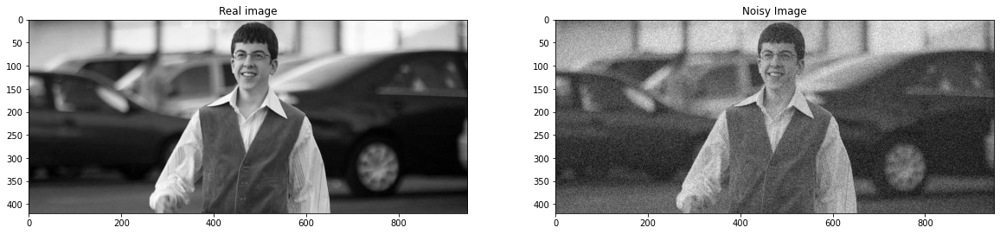

In [ ]:
# Read the image
images_dir = os.path.abspath(os.path.join(os.getcwd(), "/content/drive/MyDrive/Images"))
image_real = np.array(Image.open(os.path.join(images_dir, "/content/drive/MyDrive/Images/mclovin.pgm"))).astype(np.int16)
np.random.seed(4)
image_noisy = image_real + 2 * np.random.uniform(high = 50, size = image_real.shape)

fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 12))
ax1.imshow(image_real, cmap = "gray")
ax1.set_title("Real image")
ax2.imshow(image_noisy, cmap = "gray")
ax2.set_title("Noisy Image")

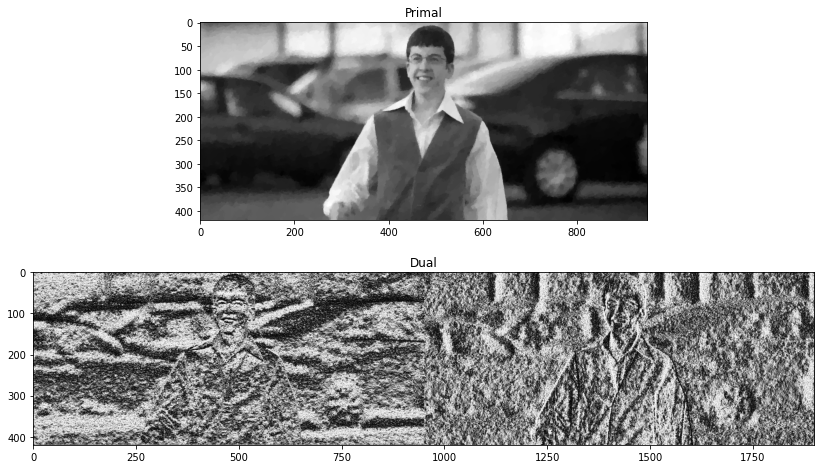

[it 500 of 500] DG = 15.712067488616627 - 15.704217584032396 = 0.007849904584231737


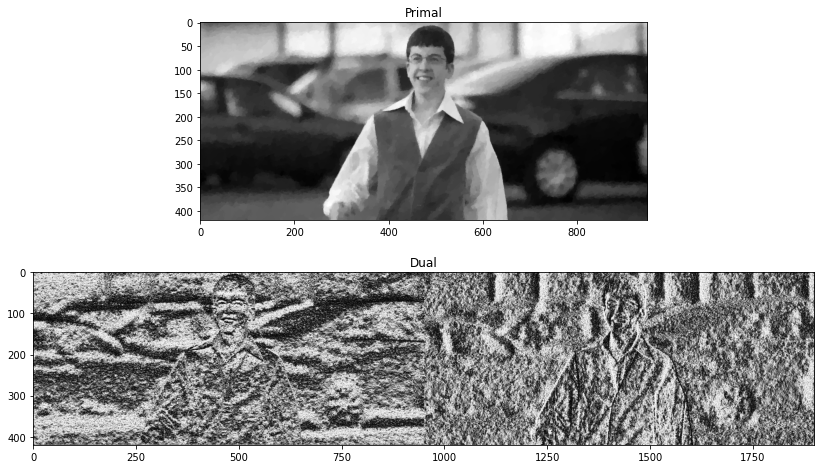

In [ ]:
# Define the parameters
lambda_ = 30
pd_prms = {"max_iters": 500,
            "tolerance": 1e-4,
            "delta": 1/4.5 / lambda_
           }

# Build up the plot
fig, (ax1, ax2) = plt.subplots(nrows = 2, ncols = 1, figsize = (14, 8))
ax1.set_title("Primal")
ax2.set_title("Dual")

# Run the primal dual
fps, fds = rof_dual(image_noisy, lambda_, pd_prms, fig, ax1, ax2)

After trying this algorithm in our own photo, which is a photo of McLovin, we observed that we got pretty good results with lambda = 30. Most of the noise was gone and the edges were preserved. It is true that it isn't perfect because it is a little blurry but it is good enough for this purpose.